In [1]:
import sys

#import params_Jay as params
#params.set_gpu_env()

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torchsummary import summary
from torch.utils.data import TensorDataset, DataLoader

from tqdm import tqdm 
import numpy as np
from skimage.transform import resize
from sklearn.metrics import mean_squared_error

import matplotlib.pyplot as plt
import matplotlib

import os
import glob

from sklearn.utils import shuffle
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.cluster import DBSCAN, KMeans, SpectralClustering, AgglomerativeClustering, OPTICS
from sklearn.cluster import *
from sklearn import cluster
from sklearn.preprocessing import StandardScaler
from sklearn.mixture import GaussianMixture, BayesianGaussianMixture
from sklearn.decomposition import PCA, KernelPCA, NMF
from sklearn.manifold import TSNE
from sklearn import manifold
from umap import UMAP
import plotly.express as px


from scipy.signal import argrelextrema

import pandas as pd

torch.__version__

image_cmap = plt.cm.inferno

/opt/anaconda3/envs/pytorch/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
rheo_images = np.load('/Users/jhorwath/Documents/XPCS_Analysis/Intermittent_Dynamics/E031_256.npy')
rheo_sectors = np.load('/Users/jhorwath/Documents/XPCS_Analysis/Intermittent_Dynamics/E031_256_sectors.npy')
rheo_times = np.load('/Users/jhorwath/Documents/XPCS_Analysis/Intermittent_Dynamics/E031_256_start.npy')
rheo_data = pd.read_pickle('/Users/jhorwath/Documents/XPCS_Analysis/Intermittent_Dynamics/E031_data/RheoData.pkl')

rheo_encoded = np.load('/Users/jhorwath/Documents/XPCS_Analysis/Intermittent_Dynamics/rheo_encoded.npy',mmap_mode='r+')
rheo_decoded = np.load('/Users/jhorwath/Documents/XPCS_Analysis/Intermittent_Dynamics/rheo_decoded.npy',mmap_mode='r+')
print(rheo_encoded.shape)
print(rheo_decoded.shape)

(900, 64)
(900, 256, 256)


## Determine Ideal Number of Clusters

Text(0, 0.5, 'inertia')

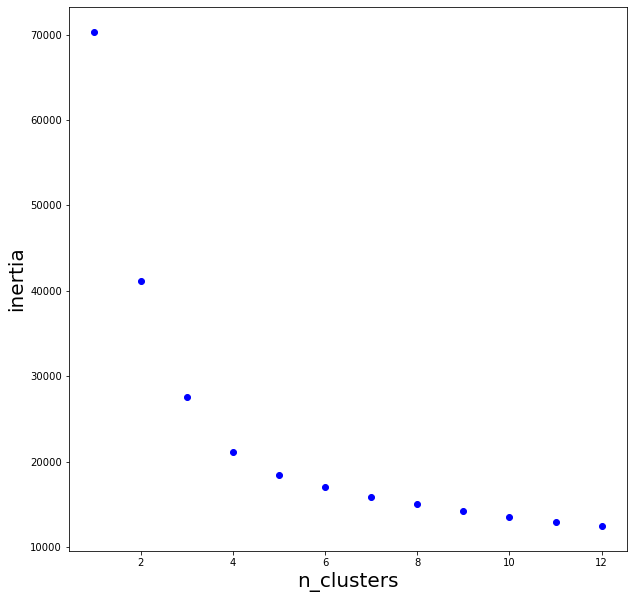

In [3]:
cluster_range = np.arange(1,13)

fig, ax = plt.subplots(figsize=(10,10))

for n_clusters in cluster_range:
    kmeans = KMeans(n_clusters = n_clusters).fit(rheo_encoded)
    ax.scatter(n_clusters,kmeans.inertia_,color='blue')
    
ax.set_xlabel('n_clusters',fontsize=20)
ax.set_ylabel('inertia',fontsize=20)
#fig.savefig('new_figures/elbow.svg')

##  KMeans clustering with 5 clusters

test tSNE, PCA, and UMAP embeddings for visualization

/opt/anaconda3/envs/pytorch/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


cluster 0: n = 192
cluster 1: n = 355
cluster 2: n = 46
cluster 3: n = 296
cluster 4: n = 11


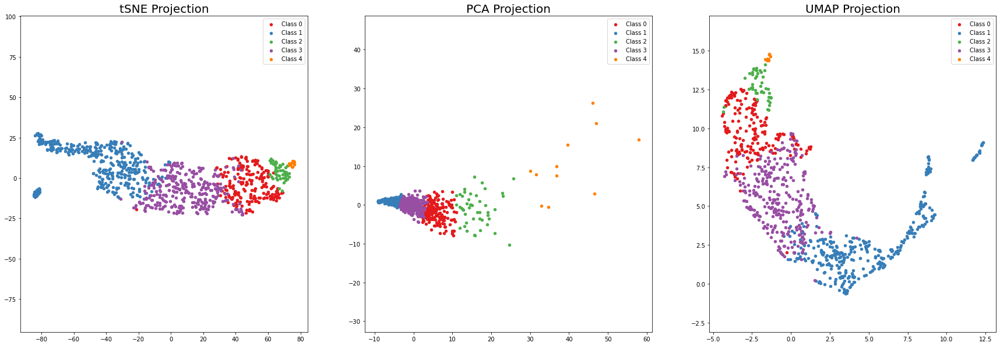

In [4]:
kmeans5 = KMeans(n_clusters=5)
cluster_labels = kmeans5.fit_predict(rheo_encoded)


tsne = TSNE(n_components=2,perplexity=20,learning_rate=10,n_iter=2500,init='pca')
tsne_trans = tsne.fit_transform(rheo_encoded)

pca = PCA(n_components=2)
pca_trans = pca.fit_transform(rheo_encoded)

#reducer = UMAP(n_components=2,n_neighbors=15,min_dist=0.01,metric='euclidean')
reducer = UMAP(n_components=2,n_neighbors=5,min_dist=0.25,metric='euclidean')
embedding = reducer.fit_transform(rheo_encoded)

colors = plt.cm.Set1(np.linspace(0,1,9))
n1 = 0
unique_labels = np.unique(cluster_labels)
fig, ax = plt.subplots(1,3,figsize=(30,10))
for i in unique_labels:
    data_tsne = tsne_trans[cluster_labels[:] == i]
    data_pca = pca_trans[cluster_labels[:] == i]
    data_embedding = embedding[cluster_labels[:] == i]
    
    print('cluster {}: n = {}'.format(i,len(data_tsne)))
    
    ax[0].scatter(data_tsne[:,0],data_tsne[:,1],color=colors[i],s=20,label='Class {}'.format(np.unique(cluster_labels)[i]))
    ax[1].scatter(data_pca[:,0],data_pca[:,1],color=colors[i],s=20,label='Class {}'.format(np.unique(cluster_labels)[i]))
    ax[2].scatter(data_embedding[:,0],data_embedding[:,1],color=colors[i],s=20,label='Class {}'.format(np.unique(cluster_labels)[i]))
    n1 += 1
    
ax[0].set_title("tSNE Projection",fontsize=20)
ax[0].axis('equal')
ax[0].legend()

ax[1].set_title("PCA Projection",fontsize=20)
ax[1].axis('equal')
ax[1].legend()

ax[2].set_title('UMAP Projection',fontsize=20)
ax[2].axis('equal')
ax[2].legend()
#fig.savefig('new_figures/tSNE_RheoOnly_5clusters.svg')

relabel clusters so that they move from right to left in the embedding space

cluster 0: n = 11
cluster 1: n = 46
cluster 2: n = 192
cluster 3: n = 296
cluster 4: n = 355


(-5.2497063159942625,
 13.181181955337525,
 -1.398661693930626,
 15.539819857478141)

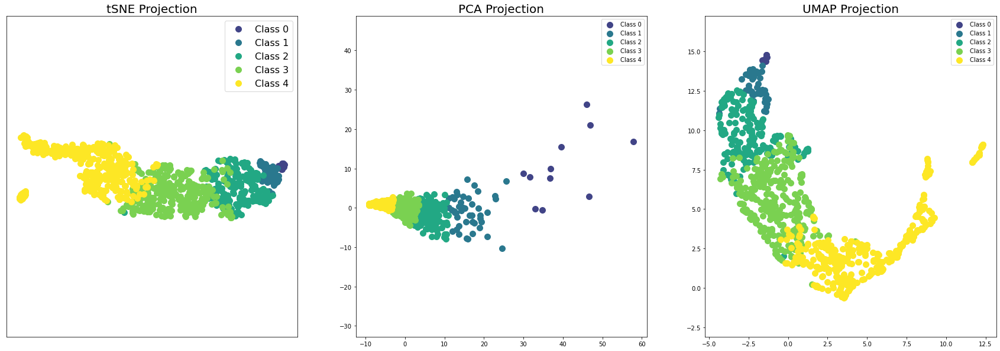

In [5]:
cluster_labels_1 = np.zeros_like(cluster_labels)
cluster_labels_1[cluster_labels[:] == 4] = 0
cluster_labels_1[cluster_labels[:] == 2] = 1
cluster_labels_1[cluster_labels[:] == 0] = 2
cluster_labels_1[cluster_labels[:] == 3] = 3
cluster_labels_1[cluster_labels[:] == 1] = 4

colors = plt.cm.viridis(np.linspace(0.2,1,5))
n1 = 0
unique_labels = np.unique(cluster_labels_1)
fig, ax = plt.subplots(1,3,figsize=(30,10))
for i in unique_labels:
    data_tsne = tsne_trans[cluster_labels_1[:] == i]
    data_pca = pca_trans[cluster_labels_1[:] == i]
    data_umap = embedding[cluster_labels_1[:] == i]
    
    print('cluster {}: n = {}'.format(i,len(data_tsne)))
    
    ax[0].scatter(data_tsne[:,0],data_tsne[:,1],color=colors[i],s=100,label='Class {}'.format(np.unique(cluster_labels)[i]))
    ax[1].scatter(data_pca[:,0],data_pca[:,1],color=colors[i],s=100,label='Class {}'.format(np.unique(cluster_labels)[i]))
    ax[2].scatter(data_umap[:,0],data_umap[:,1],color=colors[i],s=100,label='Class {}'.format(np.unique(cluster_labels)[i]))

    n1 += 1
    
ax[0].set_title("tSNE Projection",fontsize=20)
ax[0].legend(fontsize=16)
ax[0].set_xticks([])
ax[0].set_yticks([])

ax[1].set_title("PCA Projection",fontsize=20)
ax[1].legend()

ax[2].set_title('UMAP Projection',fontsize=20)
ax[2].legend()

ax[0].axis('equal')
ax[1].axis('equal')
ax[2].axis('equal')

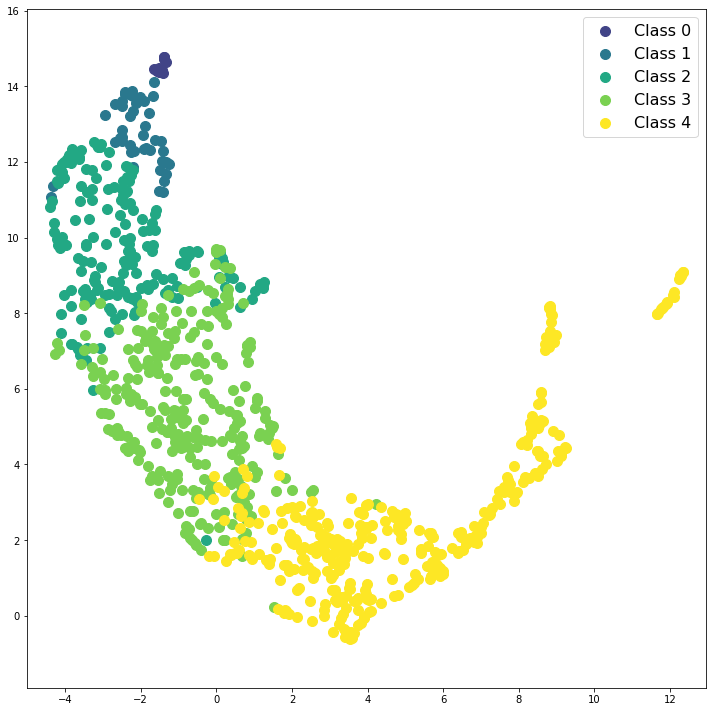

In [6]:
colors = plt.cm.viridis(np.linspace(0.2,1,5))
n1 = 0
unique_labels = np.unique(cluster_labels_1)
fig, ax = plt.subplots(figsize=(10,10))
for i in unique_labels:
    data_umap = embedding[cluster_labels_1[:] == i]
    ax.scatter(data_umap[:,0],data_umap[:,1],color=colors[i],s=100,label='Class {}'.format(np.unique(cluster_labels)[i]))

    n1 += 1
ax.axis('equal')
ax.legend(fontsize=16)
#ax.set_xticks([])
#ax.set_yticks([])
fig.tight_layout()
#fig.savefig('new_figures/umap_classes_withax.svg')

Demonstrate that each $C_2$ corresponds to one point in the latent space visualization

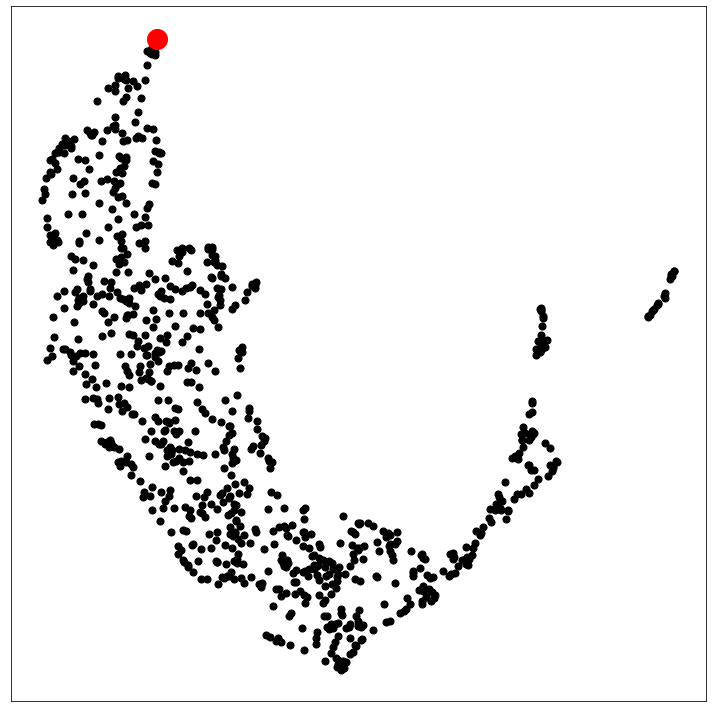

In [7]:
fig, ax = plt.subplots(figsize=(10,10))
ax.scatter(embedding[:,0],embedding[:,1],color='black',s=50)
n = np.random.choice(np.arange(len(tsne_trans)))
ax.scatter(embedding[n,0],embedding[n,1],color='red',s=400)
#ax.set_title('UMAP Projection',fontsize=20)
ax.set_xticks([])
ax.set_yticks([])
#ax.set_xlabel('UMAP Dimension 1',fontsize=16)
#ax.set_ylabel('UMAP Dimension 2',fontsize=16)
fig.tight_layout()
#fig.savefig('new_figures/UMAP_gray.svg')

## Visualize $C_2$ from each cluster

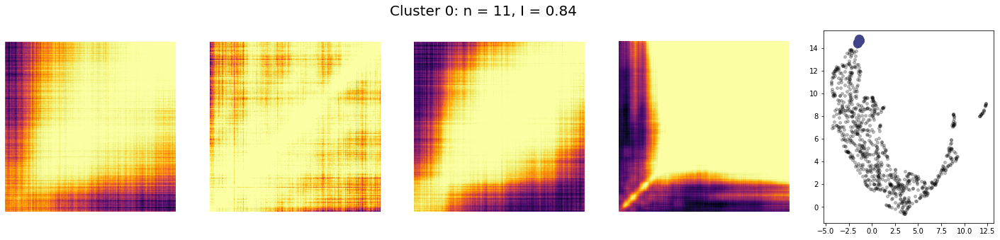

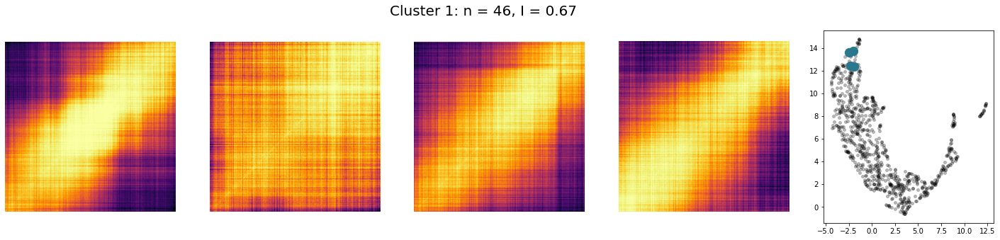

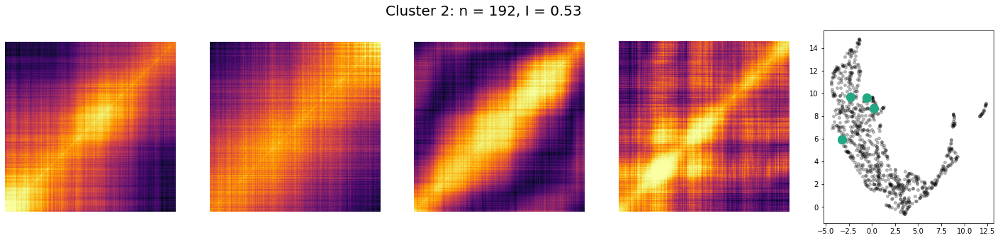

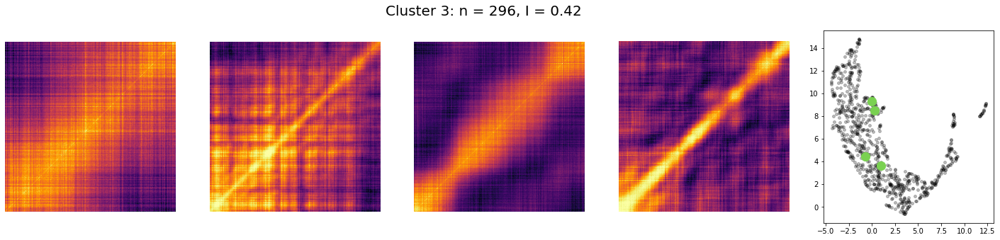

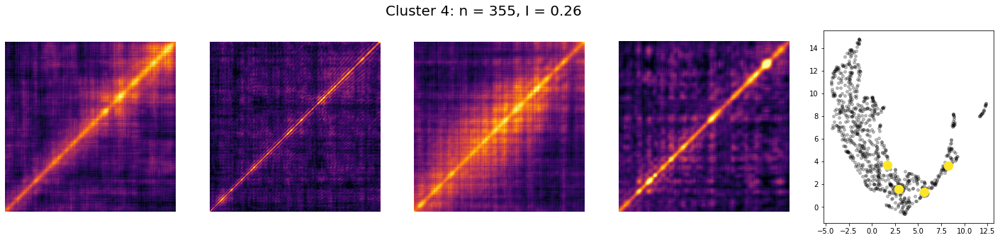

In [8]:
unique_clusters = np.unique(cluster_labels_1)

#colors = plt.cm.plasma(np.linspace(0.2,0.8,5))
n1 = 0

for i in unique_clusters:
    if i < 0:
        continue
    data = rheo_images[cluster_labels_1[:] == unique_clusters[i]]
    #data_scatter = tsne_trans[cluster_labels_1[:] == unique_clusters[i]]
    data_scatter = embedding[cluster_labels_1[:] == unique_clusters[i]]
    
    fig = plt.figure(figsize=(25,5))
    n_rows = 1
    n_cols = 5
    
    scatter_ax = fig.add_subplot(n_rows,n_cols,5)
    scatter_ax.scatter(embedding[:,0],embedding[:,1],s=15,color='black',alpha=0.25)
    
    n = np.random.choice(np.arange(len(data)),size=(4),replace=False)
    for j in range(len(n)):
        ax = fig.add_subplot(n_rows,n_cols,j+1)
        ax.imshow(data[n[j]],image_cmap,origin='lower')
        ax.axis('off')
        
        scatter_ax.scatter(data_scatter[n[j],0],data_scatter[n[j],1],color=colors[n1],s=150)
    fig.suptitle('Cluster {}: n = {}, I = {:.2f}'.format(i,len(data),np.mean(np.abs(data))),fontsize=20)
    ax.axis('equal')
#    fig.savefig('new_figures/clustering_RheoOnly_5classes_{}.svg'.format(i))
    n1 += 1

## Applications: Identify Data of Interest

Select samples of heterodyne scattering

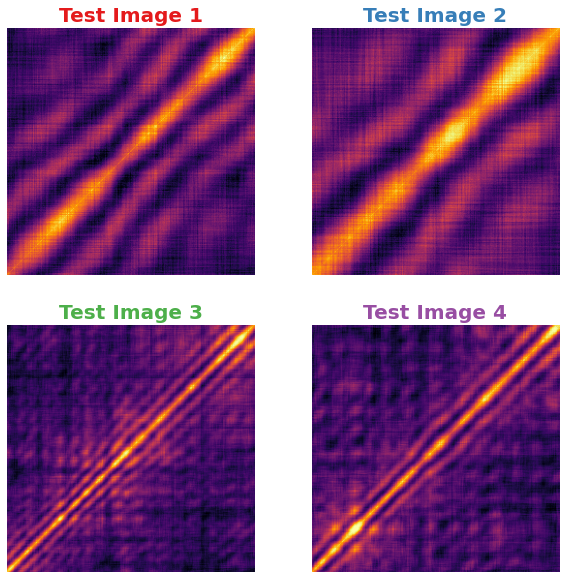

In [9]:
test_image = [465,315,607,657]

n_rows = 2
n_cols = 2

colors = plt.cm.Set1(np.linspace(0,1,9))

fig = plt.figure(figsize=(10,10))

for i in range(len(test_image)):
    ax = fig.add_subplot(n_rows,n_cols,i+1)
    ax.imshow(rheo_images[test_image[i]],image_cmap,origin='lower')
    ax.set_title('{}'.format('Test Image {}'.format(i+1)),color=colors[i],fontsize=20,fontweight='bold')
    ax.axis('off')
    
#fig.savefig('new_figures/heterodyne_sample_images.svg')

Latent space encoding of smaple images defines neighborhood of similar images

(-12.51482048034668,
 61.292995834350585,
 -12.119705724716187,
 28.102307844161988)

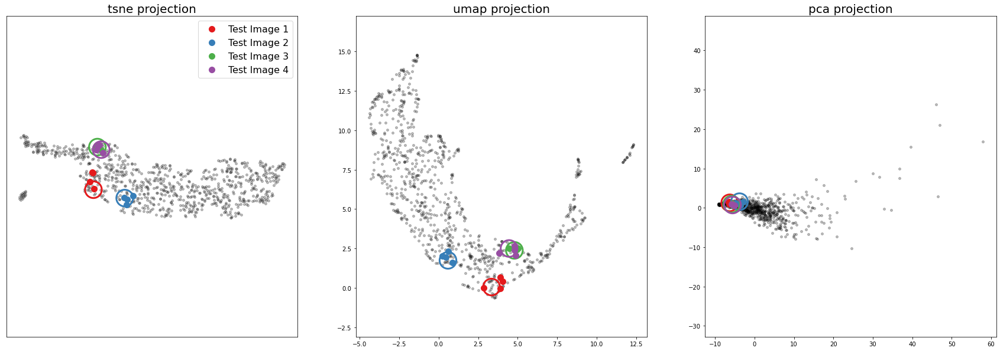

In [10]:
fig, ax = plt.subplots(1,3,figsize=(30,10))
ax[0].scatter(tsne_trans[:,0],tsne_trans[:,1],s=15,color='black',alpha=0.25)
ax[1].scatter(embedding[:,0],embedding[:,1],s=15,color='black',alpha=0.25)
ax[2].scatter(pca_trans[:,0],pca_trans[:,1],s=15,color='black',alpha=0.25)

n_neighbors = 4

for i in range(len(test_image)):
#    if i > 0:
#        break
    
    d = np.linalg.norm(rheo_encoded-rheo_encoded[test_image[i]],axis=1)
    d_sorted = np.argsort(d)
    
    ax[0].scatter(tsne_trans[d_sorted[1:n_neighbors+1],0],tsne_trans[d_sorted[1:n_neighbors+1],1],s=100,color=colors[i],label='Test Image {}'.format(i+1))   
    ax[0].scatter(tsne_trans[test_image[i],0],tsne_trans[test_image[i],1],facecolor=[],edgecolor=colors[i],linewidth=3,s=800)
    
for i in range(len(test_image)):
#    if i > 0:
#        break
    
    d = np.linalg.norm(rheo_encoded-rheo_encoded[test_image[i]],axis=1)
    d_sorted = np.argsort(d)
    
    ax[1].scatter(embedding[d_sorted[1:n_neighbors+1],0],embedding[d_sorted[1:n_neighbors+1],1],color=colors[i],s=100,label='Test Image {}'.format(i+1))   
    ax[1].scatter(embedding[test_image[i],0],embedding[test_image[i],1],facecolor=[],edgecolor=colors[i],linewidth=3,s=800)

for i in range(len(test_image)):
    d = np.linalg.norm(rheo_encoded - rheo_encoded[test_image[i]],axis=1)
    d_sorted = np.argsort(d)
    
    ax[2].scatter(pca_trans[d_sorted[1:n_neighbors+1],0],pca_trans[d_sorted[1:n_neighbors+1],1],color=colors[i],s=100,label='Test Image {}'.format(i+1))
    ax[2].scatter(pca_trans[test_image[i],0],pca_trans[test_image[i],1],facecolor=[],edgecolor=colors[i],linewidth=3,s=800)
    
ax[0].set_title('tsne projection',fontsize=20)
ax[0].set_xticks([])
ax[0].set_yticks([])
ax[0].axis('equal')
ax[0].legend(fontsize=16)

ax[1].set_title('umap projection',fontsize=20)
ax[1].axis('equal')

ax[2].set_title('pca projection',fontsize=20)
ax[2].axis('equal')

#fig.savefig('new_figures/TestImageVis.svg')

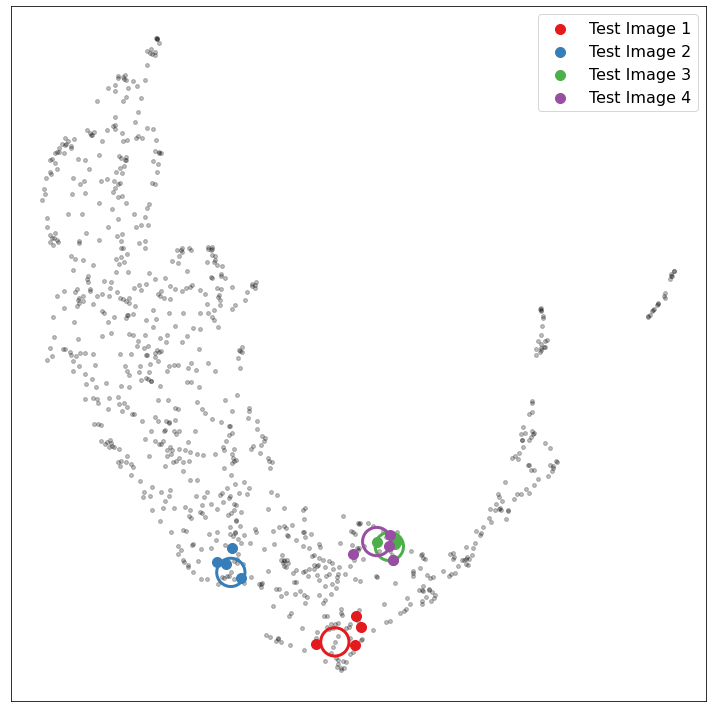

In [11]:
fig, ax = plt.subplots(figsize=(10,10))
ax.scatter(embedding[:,0],embedding[:,1],s=15,color='black',alpha=0.25)

n_neighbors = 4
    
for i in range(len(test_image)):
#    if i > 0:
#        break
    
    d = np.linalg.norm(rheo_encoded-rheo_encoded[test_image[i]],axis=1)
    d_sorted = np.argsort(d)
    
    ax.scatter(embedding[d_sorted[1:n_neighbors+1],0],embedding[d_sorted[1:n_neighbors+1],1],color=colors[i],s=100,label='Test Image {}'.format(i+1))   
    ax.scatter(embedding[test_image[i],0],embedding[test_image[i],1],facecolor=[],edgecolor=colors[i],linewidth=3,s=800)
    
ax.set_xticks([])
ax.set_yticks([])
ax.legend(fontsize=16)

#ax.set_title('UMAP projection',fontsize=20)
#ax.axis('equal')

fig.tight_layout()

#fig.savefig('new_figures/TestImageVis_UMAP.svg')

Visualizing neighborhood shows that neighboring $C_2$ in the latent space have similar appearnce to the sample image

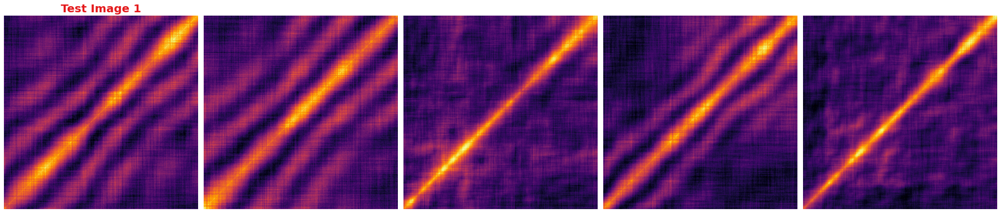

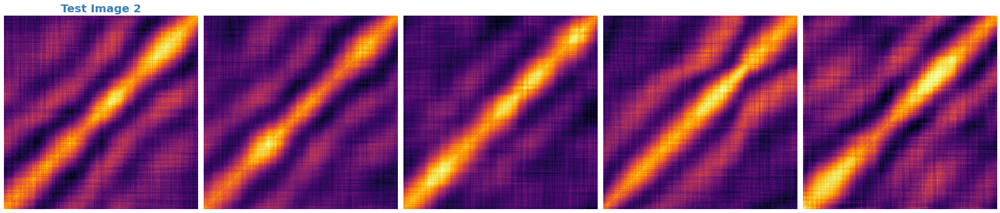

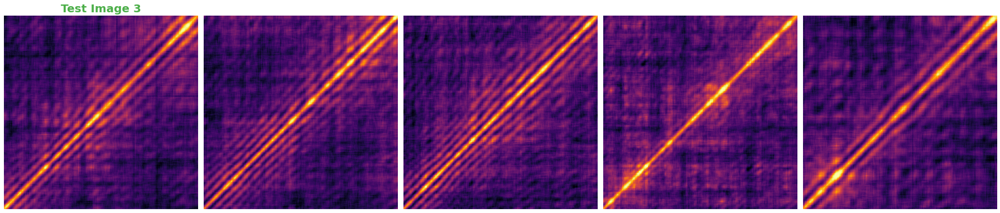

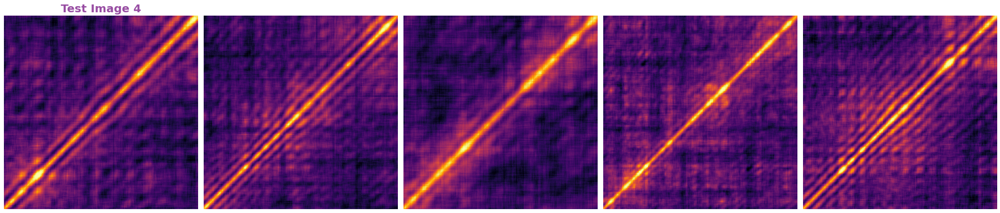

In [12]:
n_rows = 1
n_cols = 5

colors = plt.cm.Set1(np.linspace(0,1,9))

for i in range(len(test_image)):
    
    fig = plt.figure(figsize=(25,8))
    
    test_ax = fig.add_subplot(n_rows,n_cols,1)
    test_ax.imshow(rheo_images[test_image[i]],image_cmap,origin='lower')
    test_ax.axis('off')
    test_ax.set_title('{}'.format('Test Image {}'.format(i + 1)),fontsize=20,fontweight='bold',color=colors[i])
    
    d = np.linalg.norm(rheo_encoded-rheo_encoded[test_image[i]],axis=1)
    d_sorted = np.argsort(d)
    
    n = np.random.choice(np.arange(1,100),size=(4))
    
    for j in range(len(n)):
        ax = fig.add_subplot(n_rows,n_cols,j + 2)
        ax.imshow(rheo_images[d_sorted[j+1]],image_cmap,origin='lower')
        #ax.imshow(rheo_images[d_sorted[n[j]]],plt.cm.jet,origin='lower')
        ax.axis('off')
        #ax.set_title('ind: {}, distance: {:.2f}'.format(d_sorted[n[j]],d[d_sorted[n[j]]]))
        #ax.set_title('ind: {}, distance: {:.2f}'.format(d_sorted[j+1],d[d_sorted[j+1]]))
    plt.tight_layout()
#    fig.savefig('new_figures/Neighbors_Test{}_notitle.svg'.format(i+1))

## Application 2:  Matching rheology with $C_2$ appearance



Determine samples from each class during each time step of the rheology experiment

In [13]:
counts = np.zeros((len(np.unique(rheo_times)),len(unique_clusters)))
percents = np.zeros_like(counts)
n = 0

for time in np.unique(rheo_times):
    t_ind = np.where(rheo_times[:] == time)[0]
    t_clusters = cluster_labels_1[t_ind]
    
    for j in range(counts.shape[1]):
        counts[n,j] = len(t_clusters[t_clusters[:] == j])
    
    n += 1
        
percents = counts / np.sum(counts,axis=1).reshape(-1,1)

Plot rheology measurements alongside classification distribution and sample $C_2$ from each class

Class 0:  2
Class 0:  23
Class 2:  167
Class 3:  49
Class 4:  82


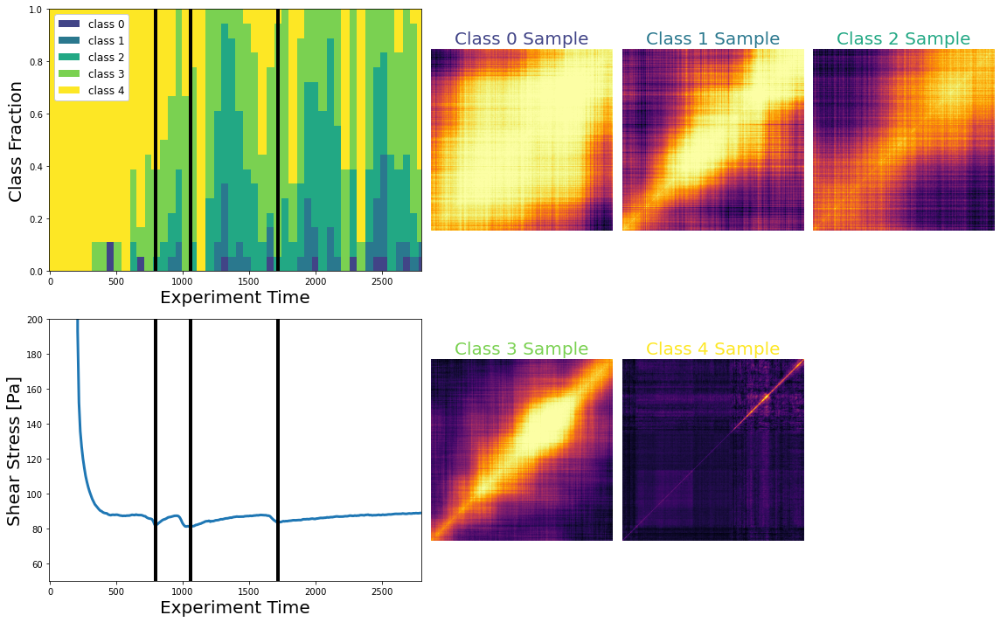

In [14]:
minima = argrelextrema(np.array(rheo_data['shear_stress']),np.less,order=20)

#image_cmap = plt.cm.plasma

fig = plt.figure(figsize=(16,10))
spec = fig.add_gridspec(2,5)

ax0 = fig.add_subplot(spec[0,:2])
t_range = np.unique(rheo_times)
#colors = plt.cm.hot(np.linspace(0.2,1,6))
colors = plt.cm.viridis(np.linspace(0.2,1,5))
bar_width = 65
n = 0



for i in range(percents.shape[1]):
    ax0.bar(t_range,percents[:,i],bottom=np.sum(percents[:,:i],axis=1),width=bar_width,color=colors[n])
    n += 1
    
ax0.legend(['class 0','class 1','class 2','class 3','class 4','class 5'],framealpha=1,fontsize=12,loc='upper left')
ax0.set_ylim([0,1.])
ax0.set_xlim([np.min(t_range),np.max(t_range)])
ax0.vlines(rheo_data['time'].iloc[minima[0][3:]],0,1.1,colors=['black'],linewidth=4)
ax0.set_xlabel('Experiment Time',fontsize=20)
ax0.set_ylabel('Class Fraction',fontsize=20)



ax1 = fig.add_subplot(spec[1,:2])
ax1.plot(rheo_data['time'],rheo_data['shear_stress'],linewidth=3)
ax1.set_ylim([50,200])
ax1.set_xlim([np.min(t_range),np.max(t_range)])
ax1.vlines(rheo_data['time'].iloc[minima[0][3:]],0,200,colors=['black'],linewidth=4)
ax1.set_xlabel('Experiment Time',fontsize=20)
ax1.set_ylabel('Shear Stress [Pa]',fontsize=20)


im0 = fig.add_subplot(spec[0,2])
class0_images = rheo_images[cluster_labels_1[:] == unique_labels[0]]
#n = 172
n = np.random.choice(np.arange(len(class0_images)))
print('Class 0: ',n)
im0.imshow(class0_images[n],image_cmap,origin='lower')
im0.axis('off')
im0.set_title('Class 0 Sample',color=colors[0],fontsize=20)

im1 = fig.add_subplot(spec[0,3])
class1_images = rheo_images[cluster_labels_1[:] == unique_labels[1]]
#n = 270
n = np.random.choice(np.arange(len(class1_images)))
print('Class 0: ',n)
im1.imshow(class1_images[n],image_cmap,origin='lower')
im1.axis('off')
im1.set_title('Class 1 Sample',color=colors[1],fontsize=20)

im2 = fig.add_subplot(spec[0,4])
class2_images = rheo_images[cluster_labels_1[:] == unique_labels[2]]
#n = 52
n = np.random.choice(np.arange(len(class2_images)))
print('Class 2: ',n)
im2.imshow(class2_images[n],image_cmap,origin='lower')
im2.axis('off')
im2.set_title('Class 2 Sample',color=colors[2],fontsize=20)

im3 = fig.add_subplot(spec[1,2])
class3_images = rheo_images[cluster_labels_1[:] == unique_clusters[3]]
#n = 52
n = np.random.choice(np.arange(len(class3_images)))
print('Class 3: ',n)
im3.imshow(class3_images[n],image_cmap,origin='lower')
im3.axis('off')
im3.set_title('Class 3 Sample',color=colors[3],fontsize=20)

im4 = fig.add_subplot(spec[1,3])
class4_images = rheo_images[cluster_labels_1[:] == unique_clusters[4]]
#n = 52
n = np.random.choice(np.arange(len(class4_images)))
print('Class 4: ',n)
im4.imshow(class4_images[n],image_cmap,origin='lower')
im4.axis('off')
im4.set_title('Class 4 Sample',color=colors[4],fontsize=20)

#im5 = fig.add_subplot(spec[1,4])
#class5_images = rheo_images[just_rheo_labels[:] == unique_rheo[5]]
##n = 52
#n = np.random.choice(np.arange(len(class5_images)))
#print('Class 5: ',n)
#im5.imshow(class5_images[n],plt.cm.jet,origin='lower')
#im5.axis('off')
#im5.set_title('Class 5 Sample',color=colors[5],fontsize=20)


#im3 = fig.add_subplot(spec[1,3])
#class3_images = rheo_images[just_rheo_labels[:] == unique_rheo[1]]
#im3.imshow(class3_images[np.random.choice(np.arange(len(class3_images)))],plt.cm.jet,origin='lower')
#im3.axis('off')
#im3.set_title('Class 3 Sample',color=colors[3],fontsize=20)

fig.subplots_adjust(hspace=0.4)
fig.tight_layout()
#fig.savefig('new_figures/Rheo_clustering_TimeAnalysis_5classes.svg')

